In [2]:
import os
from IPython.display import display, Image
import random
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from tensorflow.keras import layers, models
import pandas as pd
import matplotlib.pyplot as plt

LOAD DATA


In [1]:
# Mount adding path to Gdrive
from google.colab import drive
drive.mount('/content/drive')


data = tf.keras.utils.image_dataset_from_directory(
    '/content/drive/MyDrive/img'
)
#DISCLAIMER: Prompts to get access to all drive data

ModuleNotFoundError: No module named 'google.colab'

In [4]:
data

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

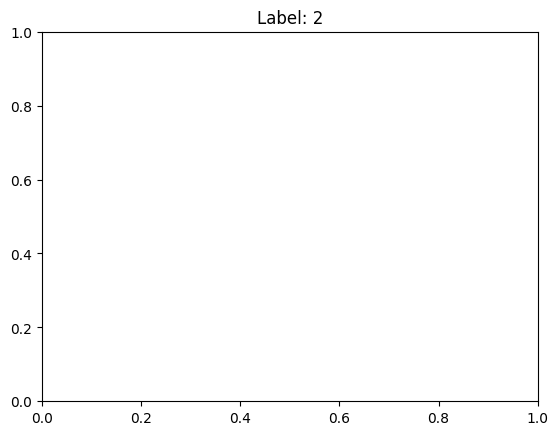

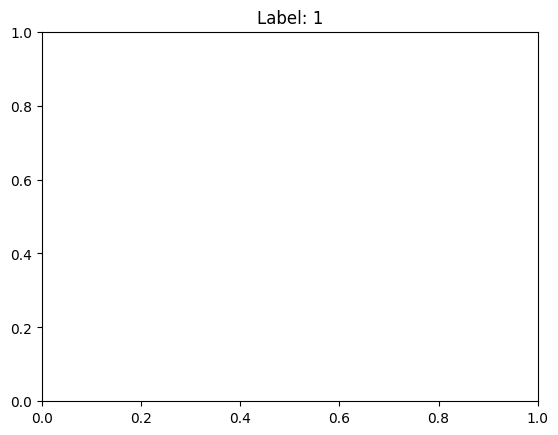

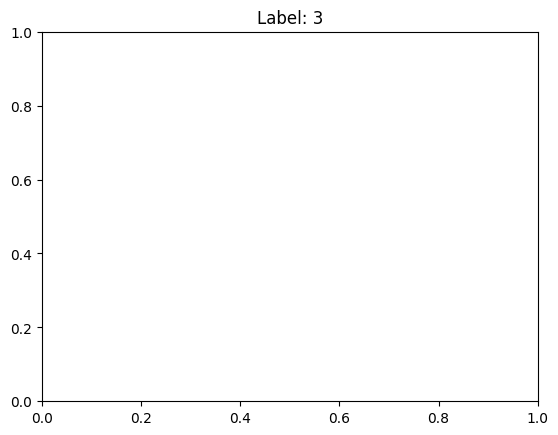

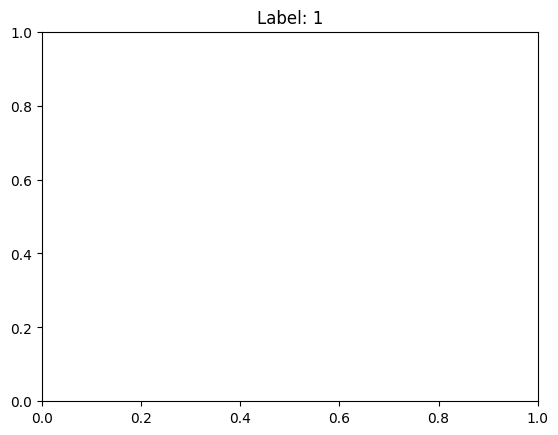

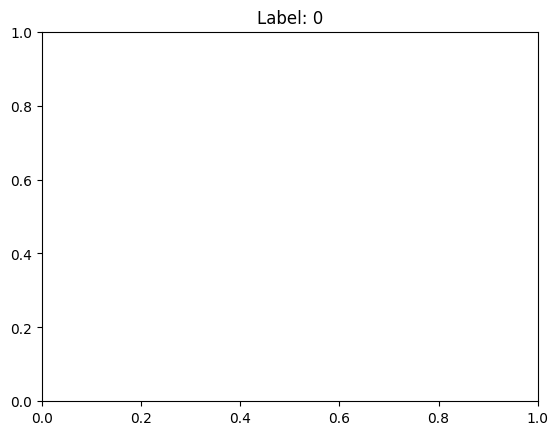

...

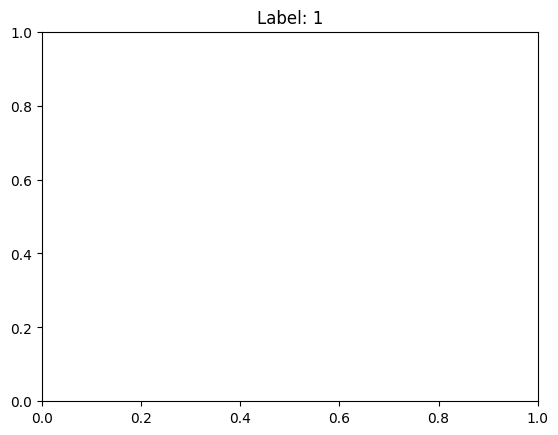

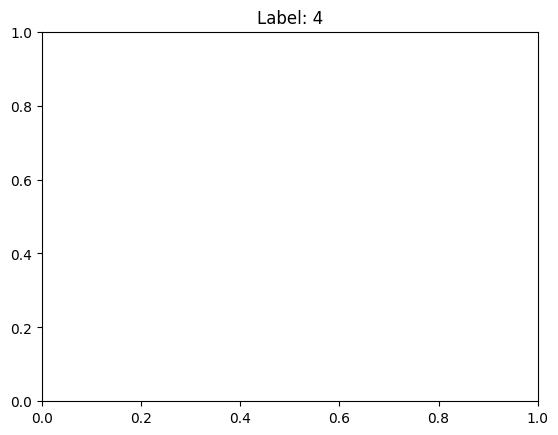

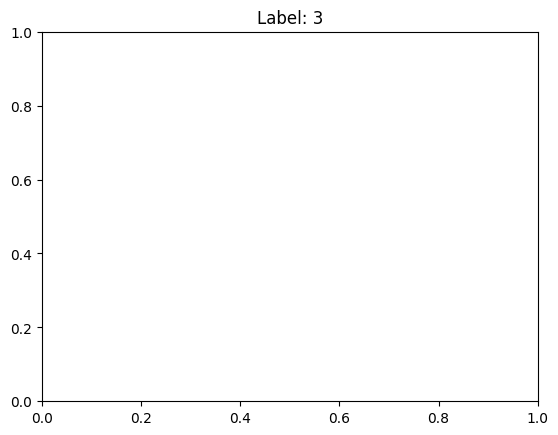

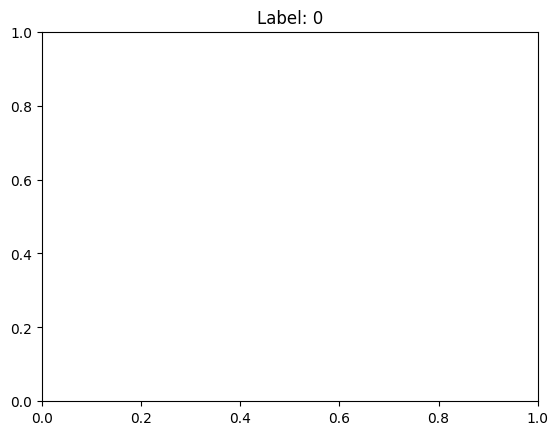

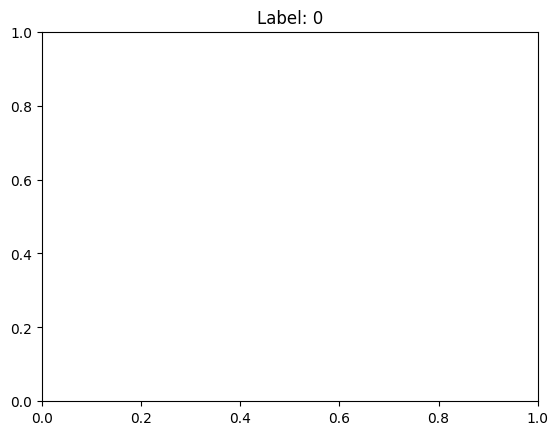

In [5]:
for element in data:
    images, labels = element
    for i in range(len(images)):
        # Assuming you are using matplotlib to display images
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(f"Label: {labels[i].numpy()}")
        plt.show()


In [6]:
    print(f"Type of element: {type(element)}")
    print(f"Type of images: {type(images)}")
    print(f"Type of labels: {type(labels)}")

Type of element: <class 'tuple'>
Type of images: <class 'tensorflow.python.framework.ops.EagerTensor'>
Type of labels: <class 'tensorflow.python.framework.ops.EagerTensor'>


In [7]:
# Check the size of the images
image_size = data.element_spec[0].shape[1:3]
print("Image size:", image_size)

Image size: (256, 256)


In [8]:
data_iterator=data.as_numpy_iterator()
batch=data_iterator.next()
#image representative as numpy array
print(len(batch))
batch[0].shape
batch[1]

2


array([4, 1, 2, 3, 2, 2, 0, 4, 3, 1, 4, 2, 2, 3, 1, 0, 3, 4, 4, 1, 4, 3,
       0, 2, 2, 1, 1, 0, 4, 4, 4, 3], dtype=int32)

In [9]:
batch_size = batch[0].shape[0]
print("Batch size:", batch_size)

Batch size: 32


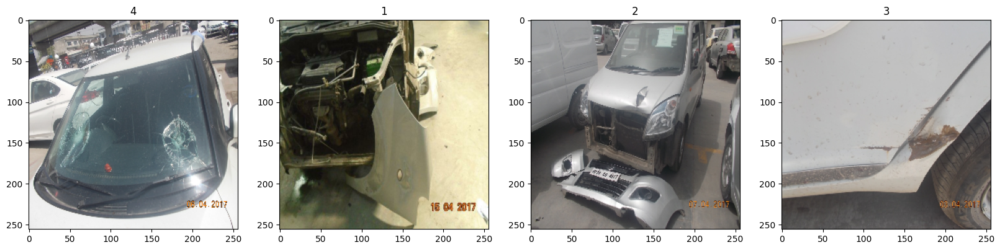

In [10]:
fig,ax=plt.subplots(ncols=4,figsize=(20,20))
for idx,img in enumerate(batch[0][:4]):
    ax[idx].imshow(img.astype(int))
    ax[idx].title.set_text(batch[1][idx])

Pre_Process Data

In [11]:
data=data.map(lambda x,y: (x/255 ,y))

In [12]:
data.as_numpy_iterator().next()

(array([[[[0.146875  , 0.04883578, 0.0213848 ],
          [0.1516544 , 0.0536152 , 0.02616422],
          [0.15686275, 0.05882353, 0.03137255],
          ...,
          [0.15435049, 0.06930147, 0.04405637],
          [0.1377451 , 0.05894608, 0.03204657],
          [0.17420343, 0.09920343, 0.06219363]],
 
         [[0.17420343, 0.08008578, 0.0408701 ],
          [0.18143383, 0.08731618, 0.04810049],
          [0.19283088, 0.09871323, 0.05949755],
          ...,
          [0.19356617, 0.08596814, 0.05753677],
          [0.18020834, 0.0726103 , 0.04234068],
          [0.196875  , 0.0958946 , 0.05447304]],
 
         [[0.19442402, 0.10030637, 0.05324755],
          [0.19761029, 0.10349265, 0.05802696],
          [0.20631127, 0.11219363, 0.07150735],
          ...,
          [0.25784314, 0.11495098, 0.07824755],
          [0.24944852, 0.10710784, 0.06875   ],
          [0.25471812, 0.11574755, 0.06501225]],
 
         ...,
 
         [[0.3814338 , 0.134375  , 0.00716912],
          [0.36513

In [13]:
len(data) #represent batch size

4

In [14]:
train_size=int(len(data)*.7)-1
val_size=int(len(data)*.2)+1
test_size=int(len(data)*.1)+1

In [15]:
print(train_size,val_size,test_size)

1 1 1


In [16]:
train=data.take(train_size)
val=data.skip(train_size).take(val_size)
test=data.skip(train_size+val_size).take(test_size)

In [17]:
#Assuming 4 classes (adjust as needed)
num_classes = 5

# Image size
img_height, img_width = 256, 256

model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_height, img_width, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(256, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.Dense(num_classes, activation='softmax')  # Multi-class classification, so using softmax activation
])

In [18]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 127, 127, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 62, 62, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 256)       147712    
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 30, 30, 256)       0

In [19]:
# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

TRAin model


In [20]:
logsdir='.\logs'

In [21]:
tensorboard_callback=tf.keras.callbacks.TensorBoard(log_dir=logsdir)

In [22]:
hist=model.fit(train,epochs=30,validation_data=val,callbacks=[tensorboard_callback])

Epoch 1/30
1/1 [==============================] - 12s 12s/step - loss: 1.5993 - accuracy: 0.3438 - val_loss: 36.6029 - val_accuracy: 0.1562
Epoch 2/30
1/1 [==============================] - 13s 13s/step - loss: 33.8003 - accuracy: 0.1875 - val_loss: 8.3332 - val_accuracy: 0.2188
Epoch 3/30
1/1 [==============================] - 9s 9s/step - loss: 9.0943 - accuracy: 0.1562 - val_loss: 5.2596 - val_accuracy: 0.0938
Epoch 4/30
1/1 [==============================] - 10s 10s/step - loss: 5.0161 - accuracy: 0.2188 - val_loss: 1.9675 - val_accuracy: 0.1875
Epoch 5/30
1/1 [==============================] - 10s 10s/step - loss: 1.8925 - accuracy: 0.2188 - val_loss: 1.6183 - val_accuracy: 0.1562
Epoch 6/30
1/1 [==============================] - 9s 9s/step - loss: 1.6149 - accuracy: 0.1562 - val_loss: 1.6171 - val_accuracy: 0.2500
Epoch 7/30
1/1 [==============================] - 10s 10s/step - loss: 1.5366 - accuracy: 0.2812 - val_loss: 1.6716 - val_accuracy: 0.1562
Epoch 8/30
1/1 [=============

In [23]:
hist.history

{'loss': [1.5992599725723267,
  33.80027770996094,
  9.094320297241211,
  5.016052722930908,
  1.8924800157546997,
  1.6148754358291626,
  1.5365793704986572,
  1.639735460281372,
  1.8746671676635742,
  1.5565245151519775,
  1.579142689704895,
  1.550917148590088,
  1.5190068483352661,
  1.492542028427124,
  1.41019868850708,
  1.6811678409576416,
  1.5112437009811401,
  1.4703361988067627,
  1.3280720710754395,
  1.4686872959136963,
  1.2758262157440186,
  1.2022563219070435,
  1.3115956783294678,
  1.115551471710205,
  1.2306385040283203,
  0.9368036985397339,
  0.9390913248062134,
  0.9055327773094177,
  0.6262156963348389,
  0.7405850887298584],
 'accuracy': [0.34375,
  0.1875,
  0.15625,
  0.21875,
  0.21875,
  0.15625,
  0.28125,
  0.21875,
  0.21875,
  0.3125,
  0.3125,
  0.28125,
  0.125,
  0.3125,
  0.46875,
  0.21875,
  0.25,
  0.28125,
  0.625,
  0.3125,
  0.625,
  0.625,
  0.34375,
  0.6875,
  0.4375,
  0.8125,
  0.75,
  0.78125,
  0.9375,
  0.78125],
 'val_loss': [36.6029

PLOT Performance

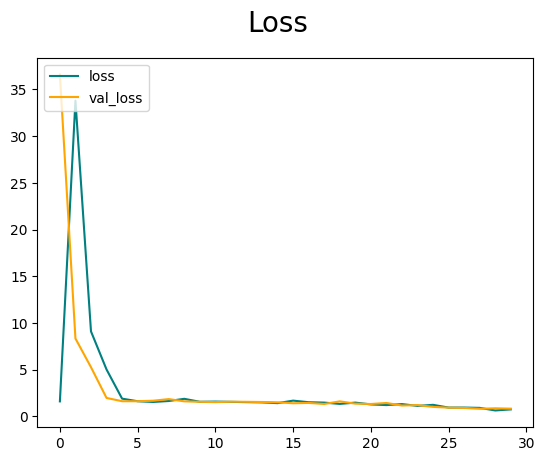

In [24]:
fig=plt.figure()
plt.plot(hist.history['loss'],color='teal',label='loss')
plt.plot(hist.history['val_loss'],color='orange',label='val_loss')
fig.suptitle('Loss',fontsize=20)
plt.legend(loc="upper left")
plt.show()

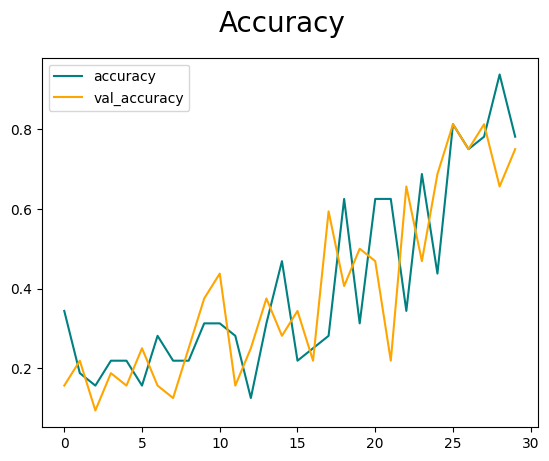

In [25]:
fig=plt.figure()
plt.plot(hist.history['accuracy'],color='teal',label='accuracy')
plt.plot(hist.history['val_accuracy'],color='orange',label='val_accuracy')
fig.suptitle('Accuracy',fontsize=20)
plt.legend(loc="upper left")
plt.show()

Evaluate Performance


In [26]:
from tensorflow.keras.metrics import Precision,Recall,SparseCategoricalAccuracy,CategoricalAccuracy

In [27]:
pre=Precision()
re=Recall()
acc=CategoricalAccuracy()

In [28]:
pre.reset_states()
re.reset_states()
acc.reset_states()

for batch in test.as_numpy_iterator():
    X, y = batch
    yhat = model.predict(X)
    print(y.shape)
    # Get predicted classes
    yhat_classes = np.argmax(yhat, axis=1)

    for actual, predicted in zip(y, yhat_classes):
        print(f"Actual: {actual}, Predicted: {predicted}")
    # Assuming 'pre', 're', 'acc' are instances of metrics classes
    pre.update_state(y, yhat_classes)
    re.update_state(y, yhat_classes)
    acc.update_state(y, yhat_classes)


1/1 [==============================] - 2s 2s/step
(32,)
Actual: 0, Predicted: 0
Actual: 0, Predicted: 0
Actual: 2, Predicted: 3
Actual: 2, Predicted: 2
Actual: 0, Predicted: 0
Actual: 3, Predicted: 0
Actual: 4, Predicted: 4
Actual: 1, Predicted: 3
Actual: 2, Predicted: 2
Actual: 3, Predicted: 3
Actual: 1, Predicted: 3
Actual: 1, Predicted: 1
Actual: 4, Predicted: 4
Actual: 2, Predicted: 3
Actual: 0, Predicted: 0
Actual: 2, Predicted: 0
Actual: 4, Predicted: 4
Actual: 3, Predicted: 0
Actual: 4, Predicted: 0
Actual: 0, Predicted: 3
Actual: 0, Predicted: 0
Actual: 2, Predicted: 0
Actual: 2, Predicted: 3
Actual: 1, Predicted: 3
Actual: 4, Predicted: 4
Actual: 3, Predicted: 3
Actual: 2, Predicted: 3
Actual: 3, Predicted: 3
Actual: 0, Predicted: 0
Actual: 3, Predicted: 3
Actual: 1, Predicted: 1
Actual: 4, Predicted: 4


1/1 [==============================] - 1s 1s/step
Actual: 0, Predicted: 0


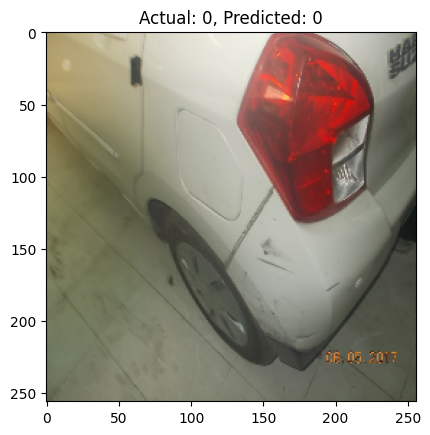

Actual: 0, Predicted: 0


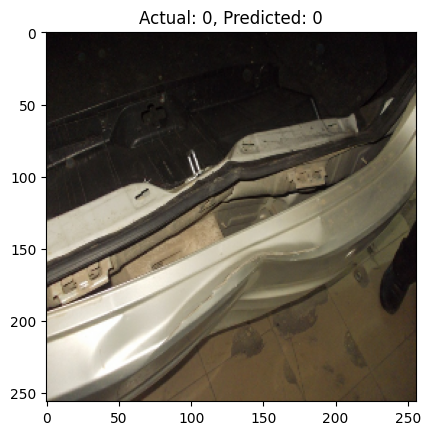

Actual: 0, Predicted: 0


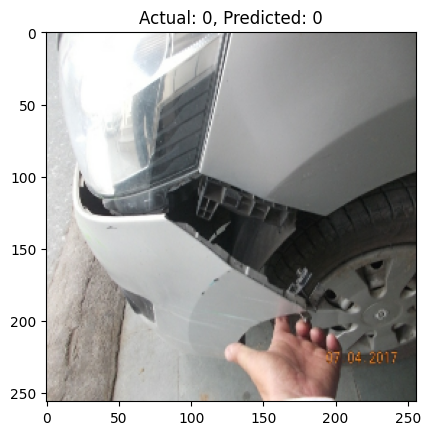

Actual: 4, Predicted: 3


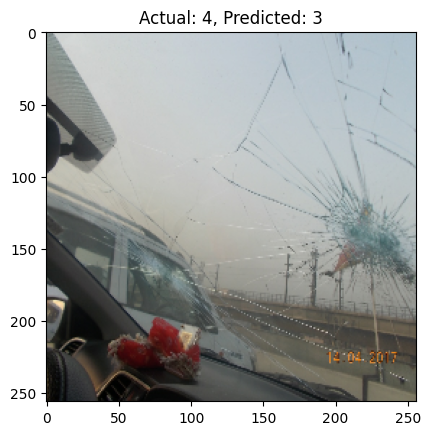

Actual: 0, Predicted: 0


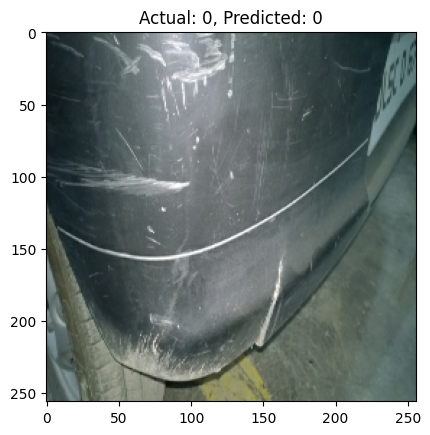

Actual: 3, Predicted: 3


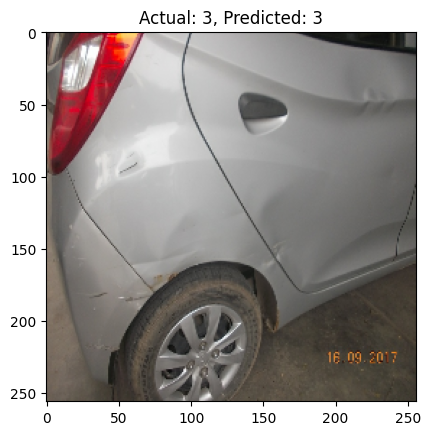

Actual: 2, Predicted: 3


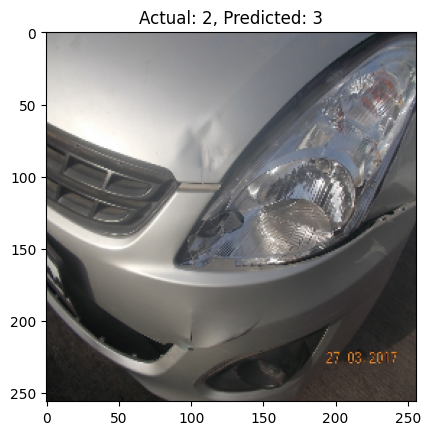

Actual: 1, Predicted: 3


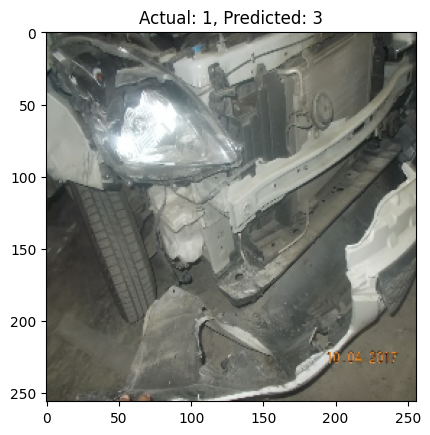

Actual: 1, Predicted: 3


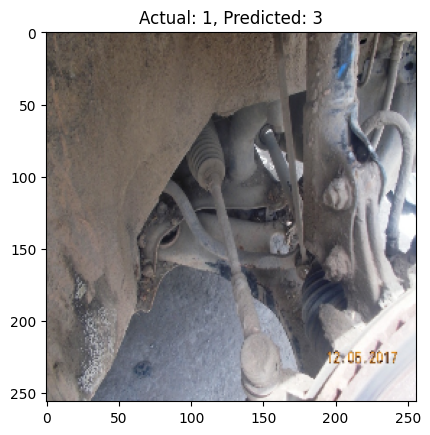

Actual: 0, Predicted: 0


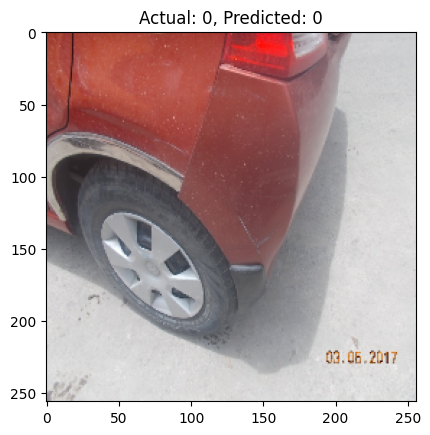

Actual: 1, Predicted: 3


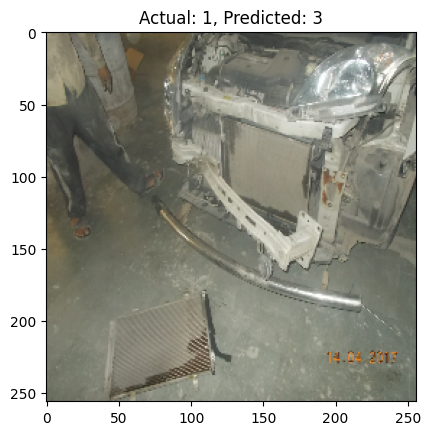

Actual: 4, Predicted: 4


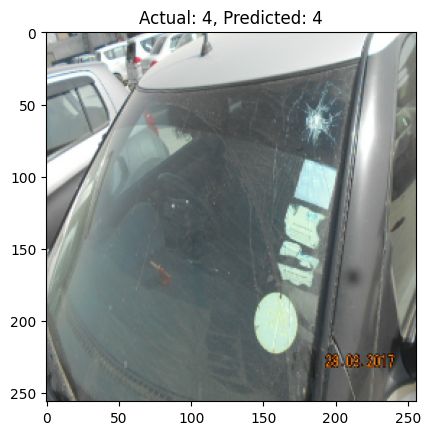

Actual: 4, Predicted: 0


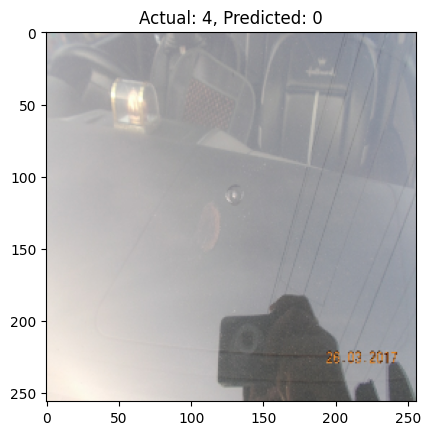

Actual: 1, Predicted: 3


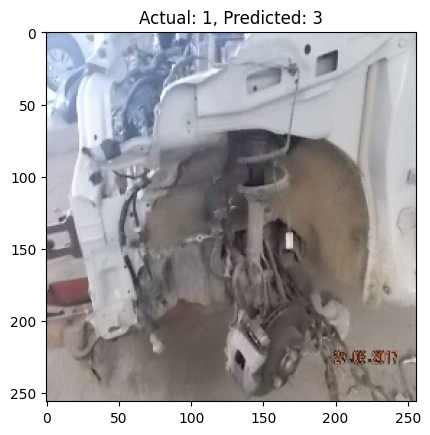

Actual: 0, Predicted: 0


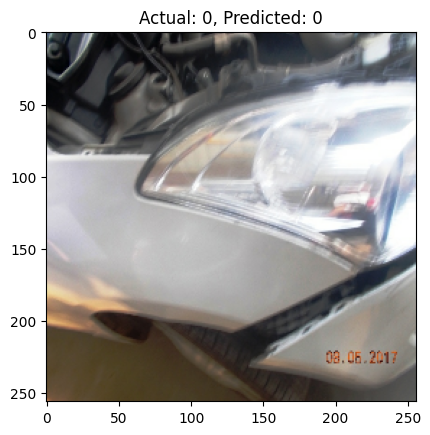

Actual: 0, Predicted: 0


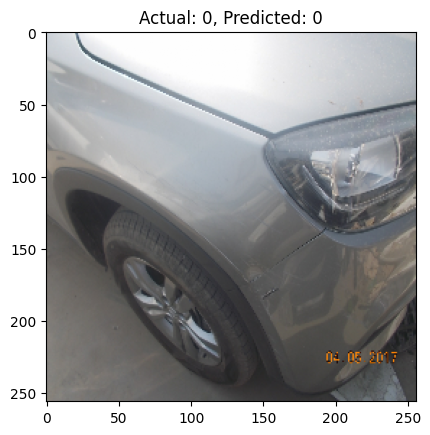

Actual: 0, Predicted: 0


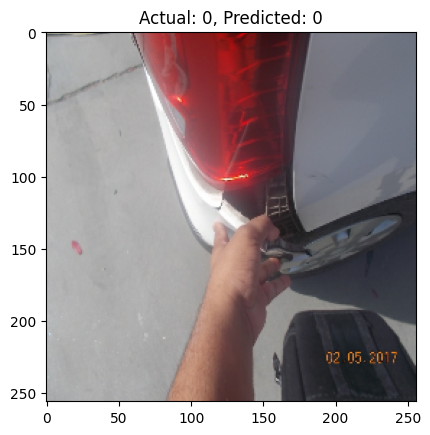

Actual: 0, Predicted: 0


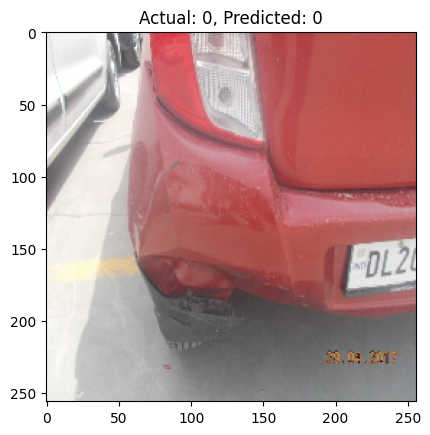

Actual: 2, Predicted: 0


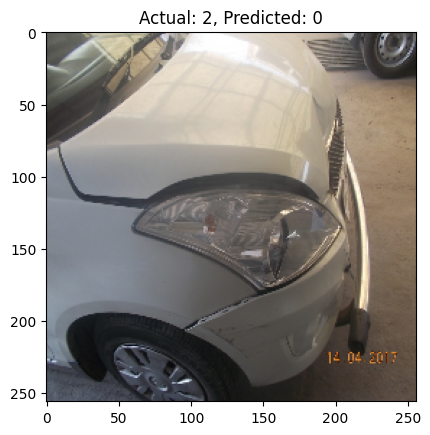

Actual: 4, Predicted: 4


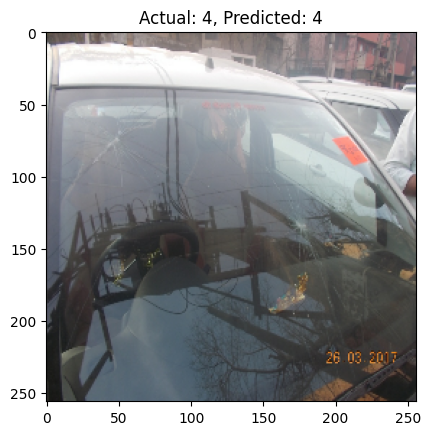

Actual: 3, Predicted: 3


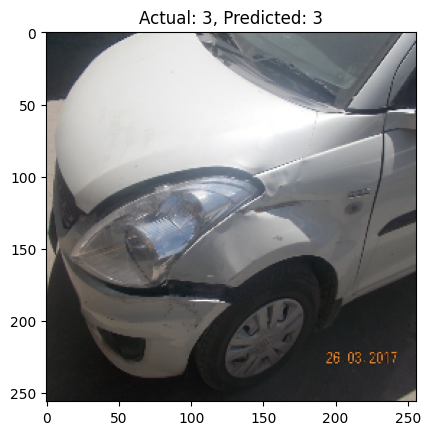

Actual: 2, Predicted: 2


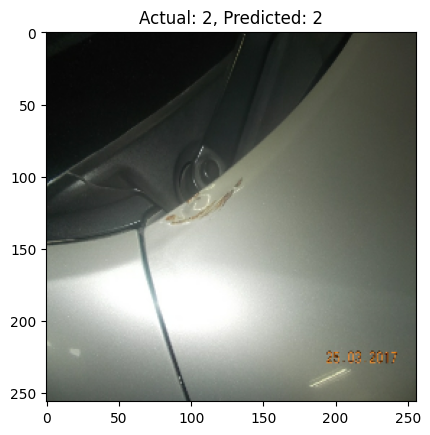

Actual: 1, Predicted: 1


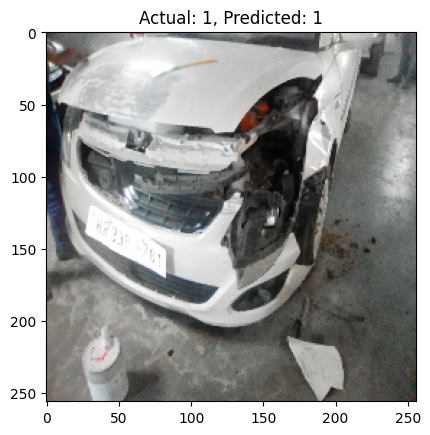

Actual: 0, Predicted: 0


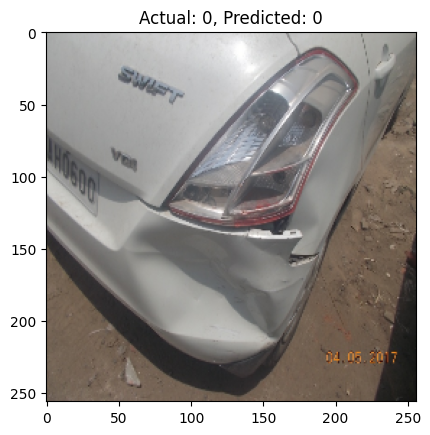

Actual: 0, Predicted: 3


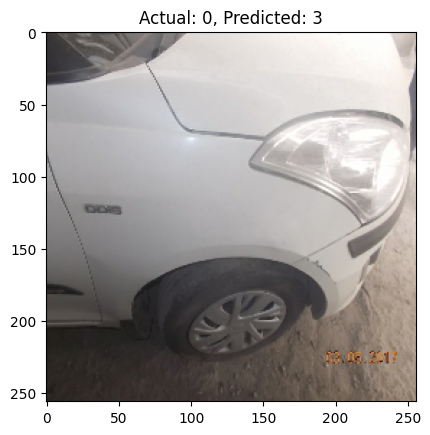

Actual: 3, Predicted: 3


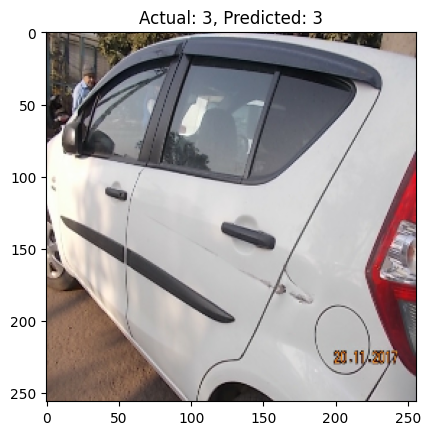

Actual: 2, Predicted: 2


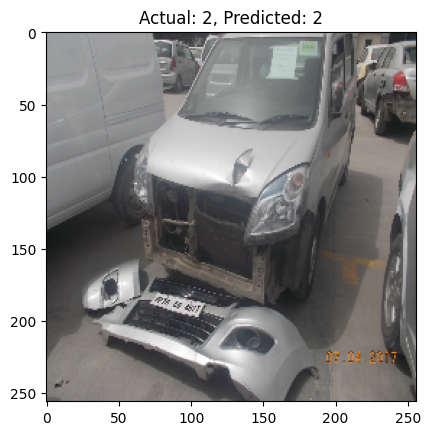

Actual: 2, Predicted: 3


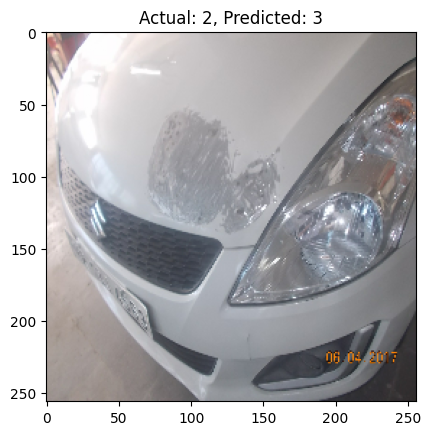

Actual: 2, Predicted: 0


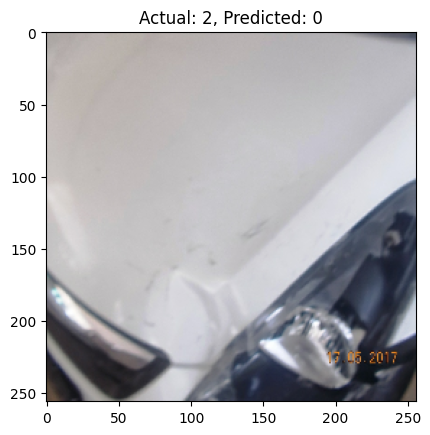

Actual: 0, Predicted: 3


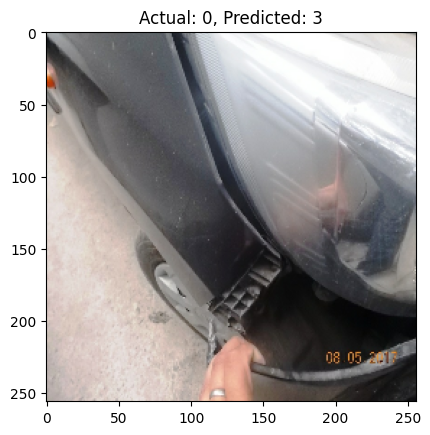

Actual: 4, Predicted: 2


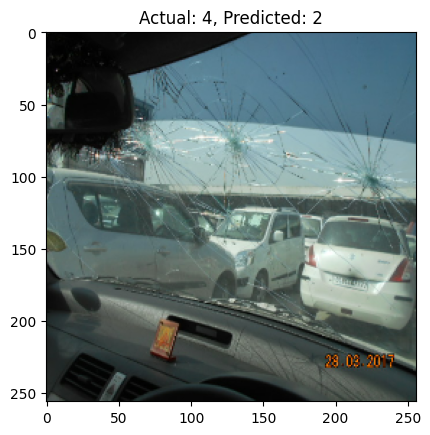

Actual: 4, Predicted: 4


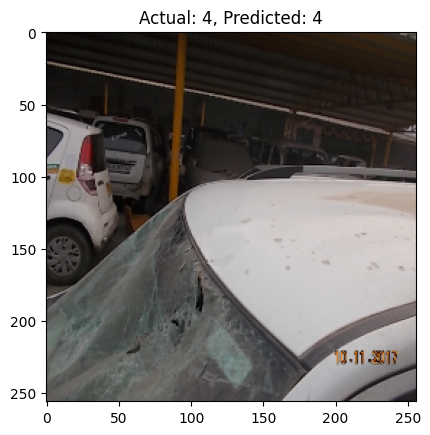

(32,) (32,)


In [29]:


pre.reset_states()
re.reset_states()
acc.reset_states()

for batch in test.as_numpy_iterator():
    X, y = batch
    yhat = model.predict(X)

    # Get predicted classes
    yhat_classes = np.argmax(yhat, axis=1)

    for i in range(len(y)):
        actual = y[i]
        predicted = yhat_classes[i]

        # Print actual and predicted labels
        print(f"Actual: {actual}, Predicted: {predicted}")

        # Display the image
        plt.imshow(X[i])
        plt.title(f"Actual: {actual}, Predicted: {predicted}")
        plt.show()
    print(y.shape,yhat_classes.shape)
    # Assuming 'pre', 're', 'acc' are instances of metrics classes
    pre.update_state(y, yhat_classes)
    re.update_state(y, yhat_classes)
    acc.update_state(y, yhat_classes)




1/1 [==============================] - 1s 1s/step
Actual: [0. 0. 1. 0. 0.], Predicted: [0. 0. 0. 1. 0.]


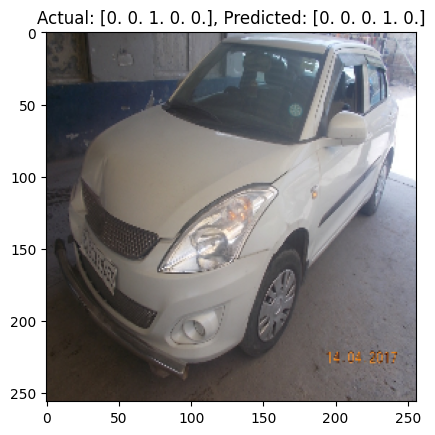

Actual: [1. 0. 0. 0. 0.], Predicted: [1. 0. 0. 0. 0.]


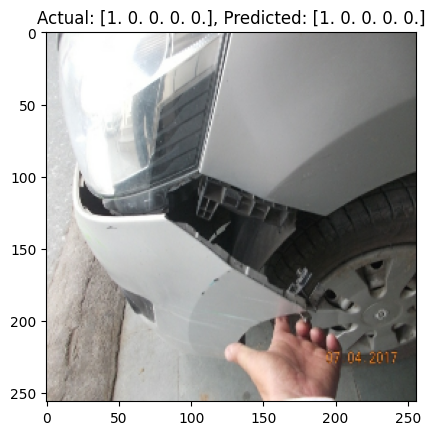

Actual: [0. 0. 1. 0. 0.], Predicted: [0. 0. 1. 0. 0.]


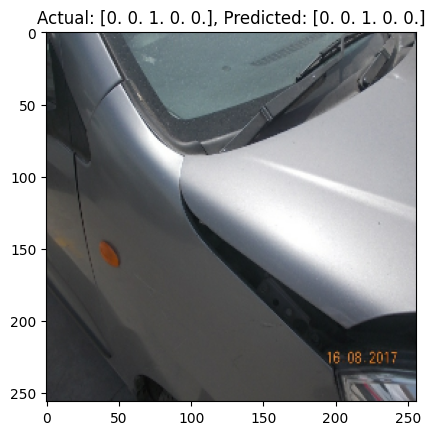

Actual: [0. 0. 0. 0. 1.], Predicted: [0. 0. 0. 0. 1.]


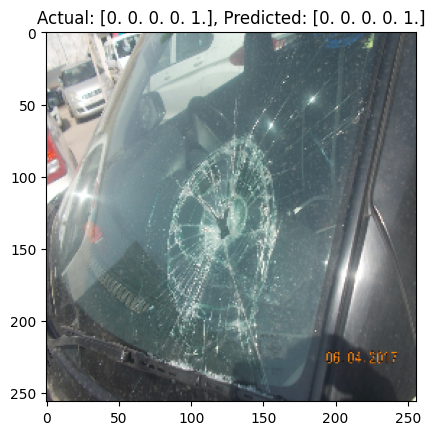

Actual: [0. 1. 0. 0. 0.], Predicted: [0. 1. 0. 0. 0.]


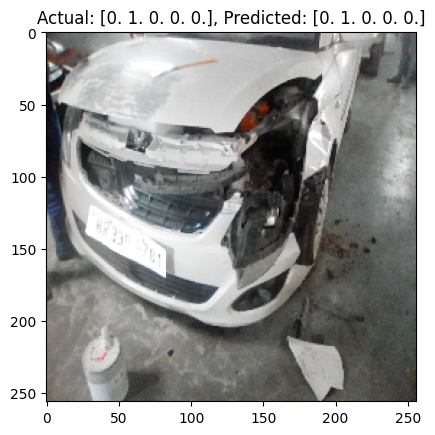

Actual: [0. 0. 0. 0. 1.], Predicted: [1. 0. 0. 0. 0.]


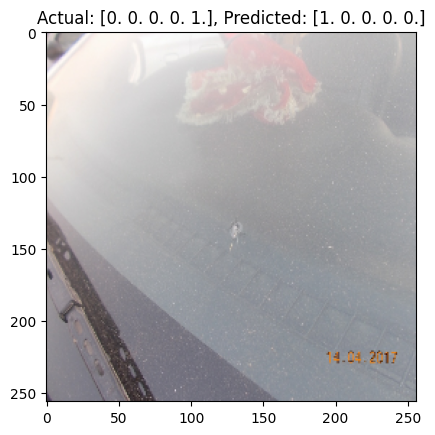

Actual: [0. 1. 0. 0. 0.], Predicted: [0. 1. 0. 0. 0.]


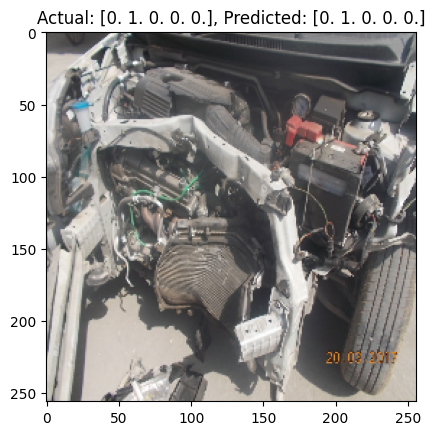

Actual: [0. 1. 0. 0. 0.], Predicted: [0. 0. 0. 1. 0.]


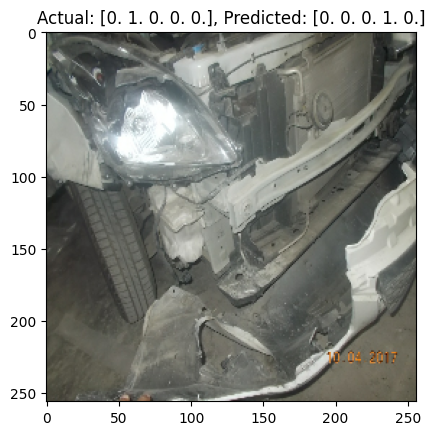

Actual: [0. 1. 0. 0. 0.], Predicted: [0. 1. 0. 0. 0.]


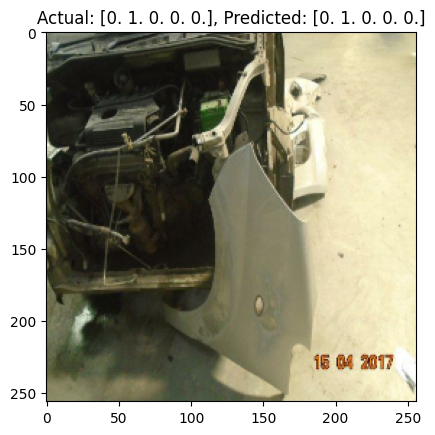

Actual: [0. 0. 1. 0. 0.], Predicted: [0. 0. 0. 1. 0.]


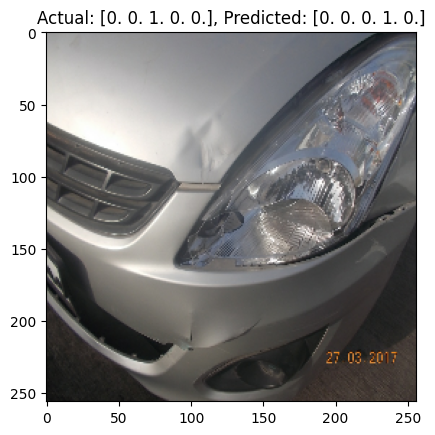

Actual: [0. 0. 0. 1. 0.], Predicted: [0. 0. 0. 1. 0.]


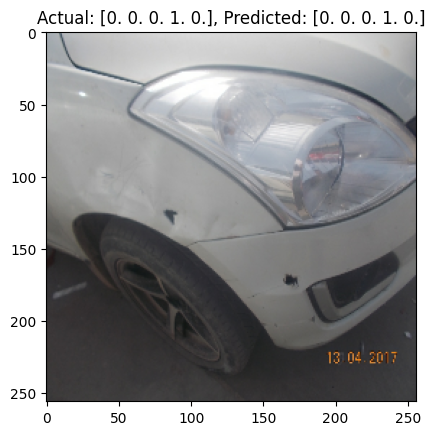

Actual: [0. 0. 0. 0. 1.], Predicted: [0. 0. 0. 0. 1.]


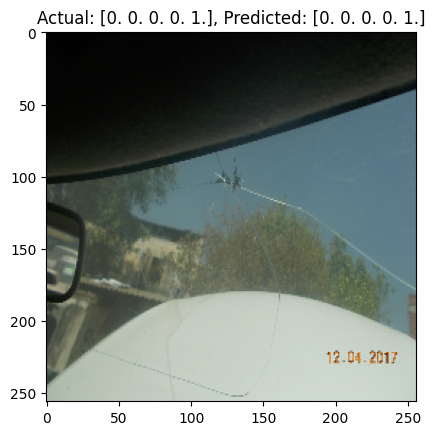

Actual: [1. 0. 0. 0. 0.], Predicted: [1. 0. 0. 0. 0.]


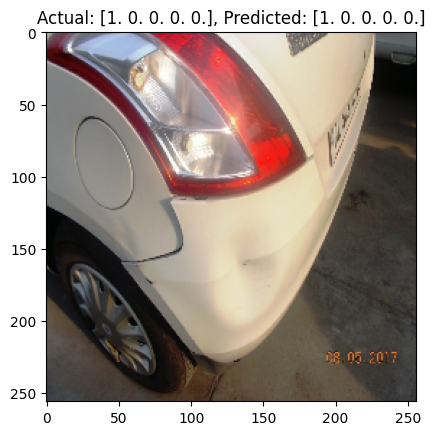

Actual: [1. 0. 0. 0. 0.], Predicted: [0. 0. 0. 1. 0.]


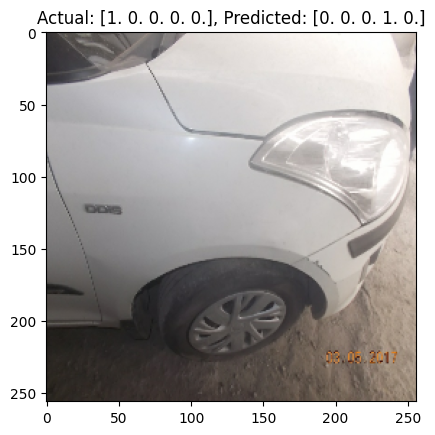

Actual: [0. 1. 0. 0. 0.], Predicted: [0. 0. 0. 1. 0.]


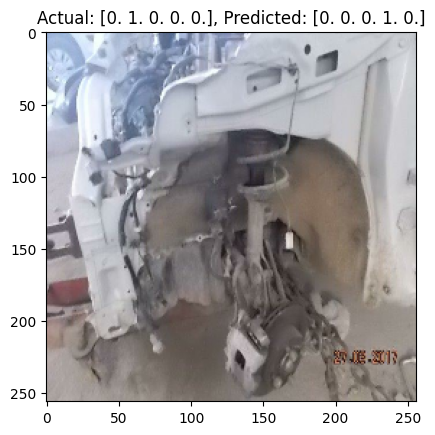

Actual: [0. 0. 0. 0. 1.], Predicted: [0. 0. 0. 0. 1.]


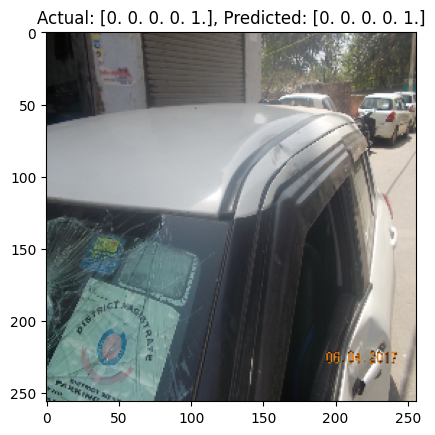

Actual: [1. 0. 0. 0. 0.], Predicted: [1. 0. 0. 0. 0.]


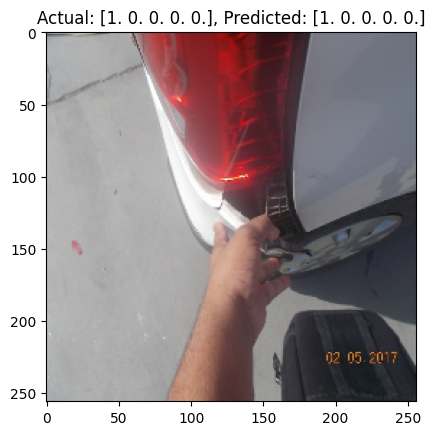

Actual: [0. 0. 0. 0. 1.], Predicted: [0. 0. 0. 0. 1.]


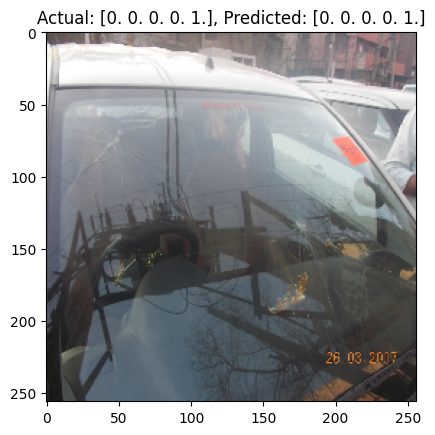

Actual: [0. 0. 0. 0. 1.], Predicted: [0. 0. 0. 0. 1.]


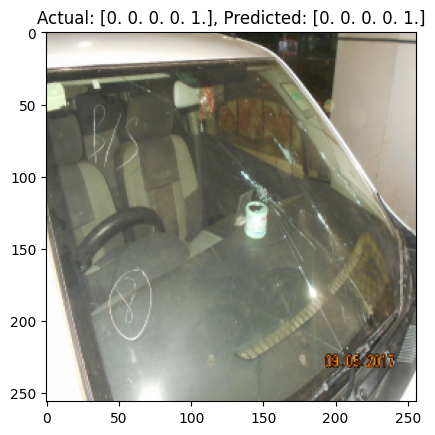

Actual: [0. 0. 0. 1. 0.], Predicted: [0. 0. 0. 1. 0.]


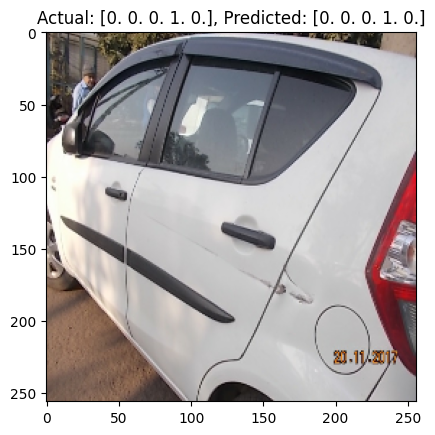

Actual: [0. 1. 0. 0. 0.], Predicted: [0. 1. 0. 0. 0.]


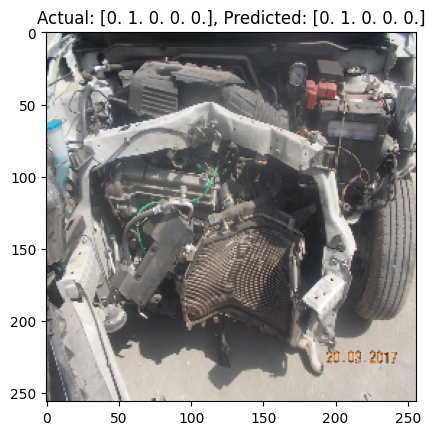

Actual: [0. 0. 0. 0. 1.], Predicted: [0. 0. 0. 0. 1.]


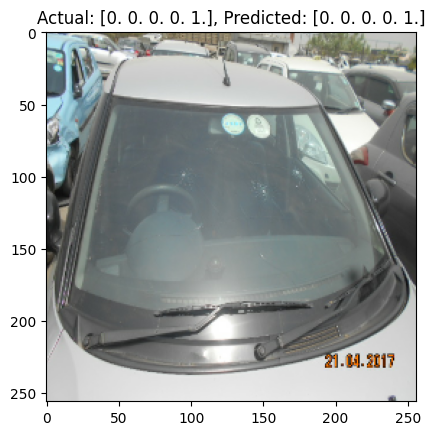

Actual: [0. 0. 0. 1. 0.], Predicted: [0. 0. 0. 1. 0.]


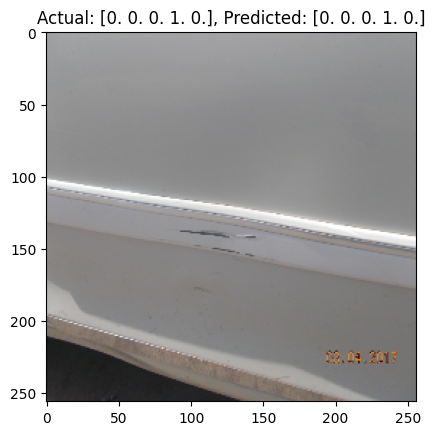

Actual: [0. 0. 1. 0. 0.], Predicted: [0. 0. 1. 0. 0.]


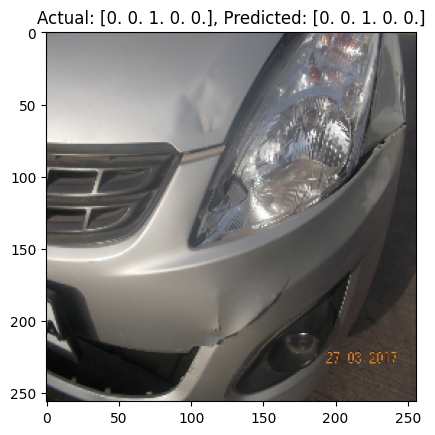

Actual: [0. 1. 0. 0. 0.], Predicted: [0. 1. 0. 0. 0.]


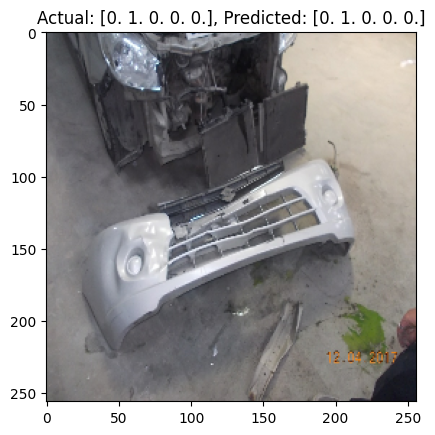

Actual: [0. 0. 0. 1. 0.], Predicted: [0. 0. 0. 1. 0.]


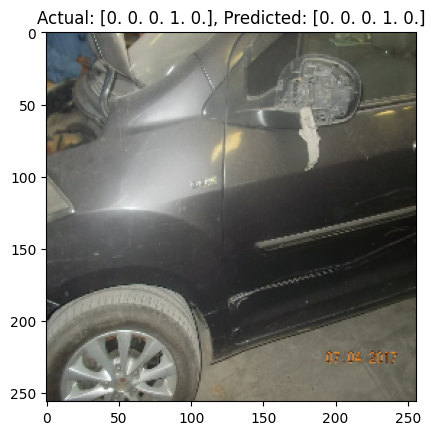

Actual: [1. 0. 0. 0. 0.], Predicted: [1. 0. 0. 0. 0.]


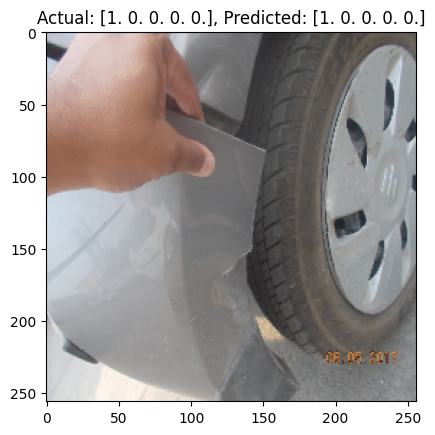

Actual: [0. 0. 1. 0. 0.], Predicted: [0. 0. 1. 0. 0.]


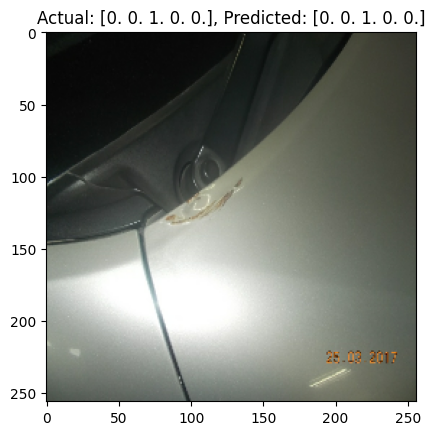

Actual: [1. 0. 0. 0. 0.], Predicted: [1. 0. 0. 0. 0.]


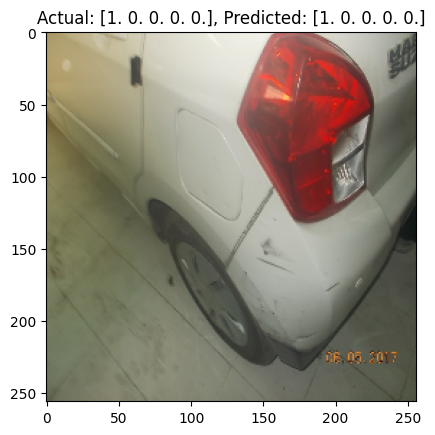

Actual: [0. 0. 0. 1. 0.], Predicted: [0. 0. 0. 1. 0.]


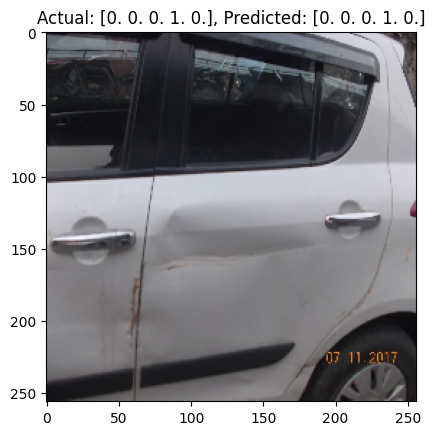

Actual: [1. 0. 0. 0. 0.], Predicted: [0. 0. 0. 1. 0.]


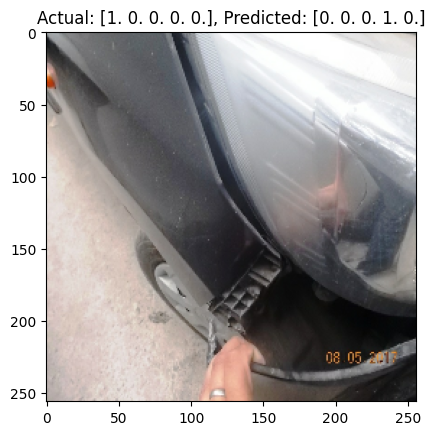

Actual: [0. 1. 0. 0. 0.], Predicted: [0. 1. 0. 0. 0.]


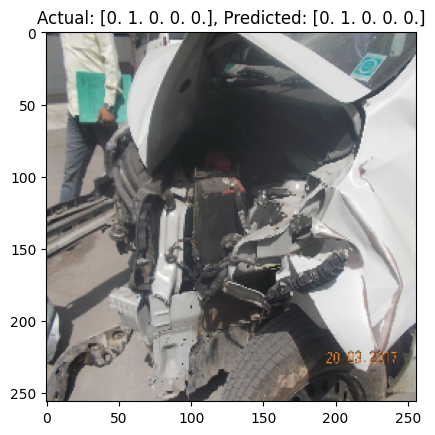

Precision: 0.800000011920929, Recall: 0.5, Accuracy: 0.78125


In [30]:
pre.reset_states()
re.reset_states()
acc.reset_states()

for batch in test.as_numpy_iterator():
    X, y = batch
    yhat = model.predict(X)

    # Get predicted classes
    yhat_classes = np.argmax(yhat, axis=1)

    # One-hot encode the labels
    y_one_hot = tf.keras.utils.to_categorical(y, num_classes=num_classes)


    for i in range(len(y)):
        actual = y_one_hot[i]
        predicted = tf.one_hot(yhat_classes[i], depth=num_classes)

        # Print actual and predicted labels
        print(f"Actual: {actual}, Predicted: {predicted}")

        # Display the image
        plt.imshow(X[i])
        plt.title(f"Actual: {actual}, Predicted: {predicted}")
        plt.show()

    # Assuming 'pre', 're', 'acc' are instances of metrics classes
    pre.update_state(y_one_hot, yhat)
    re.update_state(y_one_hot, yhat)
    acc.update_state(y_one_hot, yhat)

pre_result = pre.result().numpy()
re_result = re.result().numpy()
acc_result = acc.result().numpy()

print(f'Precision: {pre_result}, Recall: {re_result}, Accuracy: {acc_result}')


In [31]:
print(f"Precision:{pre.result().numpy()}, Recall:{re.result().numpy()}, Accuracy:{acc.result().numpy()}")

Precision:0.800000011920929, Recall:0.5, Accuracy:0.78125


Test

In [32]:
import cv2

In [2]:
import cv2
import matplotlib.pyplot as plt

def load_and_display_image(image_name):
    #save the test image files with the name.i.e. 'test_img5'
    img_path = f'/content/drive/MyDrive/{image_name}.jpg'

    #[for google colab usage], read the image from Google Drive
    img = cv2.imread(img_path)

    # Err
    if img is not None:
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(image_name)
        plt.axis('off')
        plt.show()
    else:
        print(f"Error: Failed to read the image {image_name}.")
    return img

# Print images
num_test_cases = 4 #number of images
img = []
for i in range(1, num_test_cases + 1):
    image_name = f'test_img{i}'
    img.append(load_and_display_image(image_name))


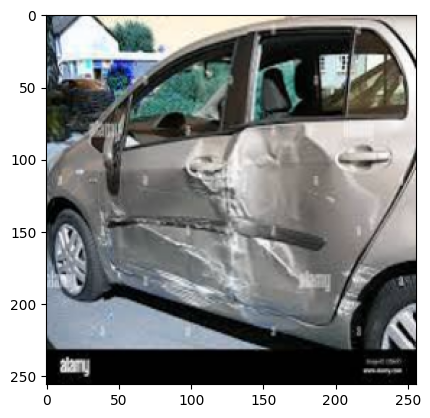

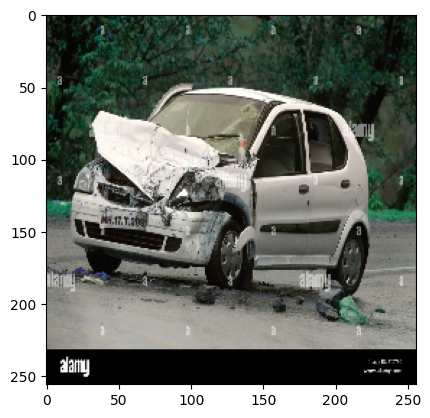

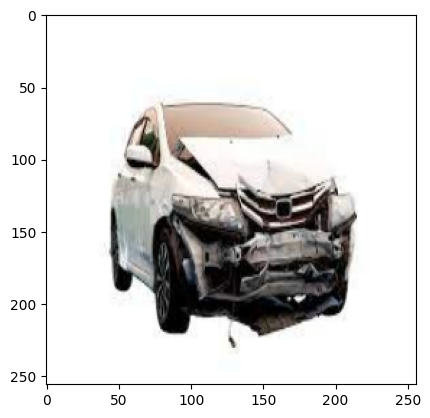

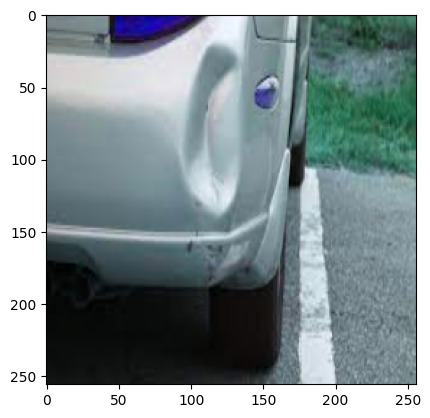

In [34]:
resize = []
for i in range(num_test_cases):
  resize.append(tf.image.resize(img[i],(256,256)))
  plt.imshow(resize[i].numpy().astype(int))
  plt.show()

In [35]:
yhat=[]
for i in range(num_test_cases):
  yhat.append(model.predict(np.expand_dims(resize[i]/255,0)))

1/1 [==============================] - 0s 113ms/step


In [36]:
predicted_class = []
for i in range(num_test_cases):
  predicted_class.append(np.argmax(yhat[i]))
  print(f'Predicted Class for image# {i+1}: {predicted_class[i]}')

Predicted Class for image# 1: 3
Predicted Class for image# 2: 1
Predicted Class for image# 3: 3
Predicted Class for image# 4: 0


In [37]:
yhat

[array([[0.15994267, 0.05223862, 0.13804922, 0.37497237, 0.27479714]],
       dtype=float32),
 array([[0.08982598, 0.43899408, 0.08474703, 0.38519505, 0.00123792]],
       dtype=float32),
 array([[0.13118608, 0.08187807, 0.02633904, 0.7592754 , 0.00132148]],
       dtype=float32),
 array([[0.33858368, 0.02019516, 0.10687528, 0.29642037, 0.23792548]],
       dtype=float32)]